In [ ]:
import sys
sys.path.append('/home/lumargot/trachoma/src/py')

import os 
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # put -1 to not use any

In [2]:
import os
import pandas as pd
import numpy as np 

import torch
import cv2

from tqdm import tqdm
import matplotlib.pyplot as plt
import SimpleITK as sitk

from  PIL  import  Image
from basicsr.archs.rrdbnet_arch import RRDBNet
from realesrgan import RealESRGANer

/tools/anaconda3/envs/flyby/lib/python3.9/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


In [3]:
def compute_patch_size(seg, pad):
  seg = torch.Tensor(seg)
  shape = seg.shape

  ij = torch.argwhere(seg.squeeze() !=0.)
  bb = torch.tensor([0, 0, 0, 0]) # xmin, ymin, xmax, ymax

  bb[0] = torch.clip(torch.min(ij[:,1]) - pad, 0, shape[1])
  bb[1] = torch.clip(torch.min(ij[:,0]) - pad, 0, shape[0])
  bb[2] = torch.clip(torch.max(ij[:,1]) + pad, 0, shape[1])
  bb[3] = torch.clip(torch.max(ij[:,0]) + pad, 0, shape[0])

  patch_w = (bb[2] - bb[0])/10

  patch_size = min(int(patch_w), 64)
  return patch_size, bb


In [6]:
directory = '/CMF/data/lumargot/trachoma/patches/csv_subjects'
out_dir = '/CMF/data/lumargot/trachoma/patches/added_patches/cv2_patches/'
img_dir = '/CMF/data/lumargot/trachoma/B images one eye/img'
seg_dir = '/CMF/data/lumargot/trachoma/B images one eye/seg'
weight_path = '/CMF/data/lumargot/trachoma/output/Real_Esrgan_weights/RealESRGAN_x4plus.pth'


In [ ]:

SCALE=4
model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=SCALE)
upsampler = RealESRGANer(scale=SCALE, model_path=weight_path, dni_weight=None, model=model)


csv_list = os.listdir(directory)
num_subject = len(csv_list)
for index_csv in range(num_subject):
  csv_name = csv_list[index_csv]
  # csv_file = os.path.join(directory, csv_name)

  # df = pd.read_csv(csv_file)
  # num_patches = 3 #len(df)
  subject_name = os.path.splitext(csv_name)[0]
  subject_path = os.path.join(img_dir, subject_name+'.jpg')
  seg_path =  os.path.join(seg_dir, subject_name+'.nrrd')

  image  = np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(subject_path)))
  seg  = np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(seg_path)))
  H,W = image.shape[:2]
  pad, bb = compute_patch_size(seg, pad = 5)
  seg_cropped = seg[bb[1]:bb[3], bb[0]: bb[2]]
  img_cropped = image[bb[1]:bb[3], bb[0]: bb[2],:]



  h,w = seg_cropped.shape
  delta = int(pad/2)
  patch_15_tl = img_cropped[delta:pad+delta, delta:pad+delta] 
  patch_15_tr = img_cropped[delta:pad+delta, -pad-delta:-delta] 
  patch_15_bl = img_cropped[-pad-delta:-delta, delta:pad+delta] 
  patch_15_br = img_cropped[-pad-delta:-delta,-pad-delta:-delta] 

  patch_tl = img_cropped[:pad, :pad] 
  patch_tr = img_cropped[:pad, -pad:] 
  patch_bl = img_cropped[-pad:, :pad] 
  patch_br = img_cropped[-pad:,-pad:] 

  # np_patches = [patch_tl, patch_tr, patch_bl, patch_tl]


  patches = { 'TL': patch_tl,
              'TR': patch_tr,
              'BL': patch_bl,
              'BR': patch_br,
              '1.5TL': patch_15_tl,
              '1.5TR': patch_15_tr,
              '1.5BL': patch_15_bl,
              '1.5BR': patch_15_br }

  for k in patches.keys():
    img = patches[k]

    if img.shape[0] < 128:
      img_tmp = cv2.resize(img, (512, 512), interpolation=cv2.INTER_CUBIC)
    else:
      img_tmp = img

    upscaled_image, _ = upsampler.enhance(img_tmp)
    
    name = f"patch_{subject_name}_{k}_corner_class_Reject.png"

    pi_up_img = Image.fromarray(img_tmp)
    pi_up_img.save(os.path.join(out_dir, name))


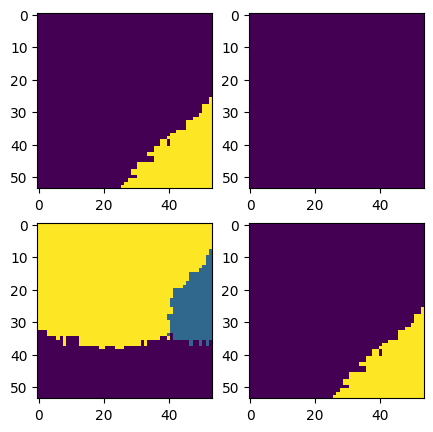

In [34]:
plt.figure(figsize=(5,5))
for i in range(4):
  plt.subplot(2,2,i+1)
  plt.imshow(np_patches[i])

#### add rejected samples to existing csv

In [8]:
csv_folder = '/CMF/data/lumargot/trachoma/patches/csv'
patch_folder = '/CMF/data/lumargot/trachoma/patches/added_patches/cv2_patches/'

In [19]:
l_cid = []
l_path = []
l_label = []
l_class = []
mapping = {'Healthy':0, 'ECA':1, 'Entropion':2, 'Gap':3, 'overcorrection':4, 'Short Incision':5,'Reject':6,}

for patch in os.listdir(patch_folder):
  split = patch.split('_')
  if len(split) == 7:
    _, cid, _, _, _, _, label = patch.split('_')
  else:
    _, cid, _, _, _, _, _, label = patch.split('_')
  label = os.path.splitext(label)[0]

  if label  in mapping.keys():
    class_id = mapping[label]
    l_cid.append(cid)
    l_path.append(patch)
    l_label.append(label)
    l_class.append(class_id)


df_all_patch = pd.DataFrame(data={'cid':l_cid, 'path':l_path, 'label':l_label,'class':l_class })

In [21]:
df_all_patch.to_csv('/CMF/data/lumargot/trachoma/patches/csv/patches_cv2.csv')

In [11]:
df = pd.read_csv('/CMF/data/lumargot/trachoma/patches/csv/new/Pret_excluded_clean.csv')

In [15]:
df[ ['label', 'class']].drop_duplicates()

,label,class
0,Healthy,0
12,ECA,1
16,Entropion,2
19,Gap,3
24,overcorrection,4
70,Short Incision,5
8201,Reject,6


In [ ]:
for csv_name in os.listdir(csv_folder):
  csv_path = os.path.join(csv_folder, csv_name)
  df = pd.read_csv(csv_path)
  df_out = df.__deepcopy__()

  # get all subject_ids
  subject_ids = df['cid'].unique()

  # from subject_ids list find all Reject.png images
  for cid in subject_ids:
    df_cid = df_all_patch.loc[df_all_patch['cid'].astype(int) == cid]
    df_reject = df_cid.loc[df_cid['label'] == 'Reject']

    df_reject['x_patch'] = -1
    df_reject['y_patch'] = -1

    df_reject['2class'] = len(df['2class'].unique())
    df_reject['class'] = len(df['class'].unique())

    df_out = pd.concat([df_out, df_reject])

  df_out.to_csv(csv_path)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/